## Implementing Convolutional Layers Using Keras

In [6]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D,MaxPooling2D,Input
model = Sequential([
    Input(shape=(128,128,3)),  #Input image shape:128x128 pixels, 3channels(RGB)
    Conv2D(filters=8,kernel_size=(3,3),activation='relu',name='conv1'), #Applies 8 filters of size 3x3
    MaxPooling2D(pool_size=(2,2),name='pool1'), #reduces the width and size by half
    Conv2D(filters=16,kernel_size=(3,3),activation='relu',name='conv2'),
    MaxPooling2D(pool_size=(2,2),name='pool2')
])

model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1 (Conv2D)                       │ (None, 126, 126, 8)         │             224 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ pool1 (MaxPooling2D)                 │ (None, 63, 63, 8)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2 (Conv2D)                       │ (None, 61, 61, 16)          │           1,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ pool2 (MaxPooling2D)                 │ (None, 30, 30, 16)          │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,392 (5.44 KB)

 Trainable params: 1,392 (5.44 KB)

 Non-trainable params: 0 (0.00 B)

## LeNet code (Keras Style for MNIST)

In [30]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D,AveragePooling2D,Flatten,Dense
from tensorflow.keras.datasets import mnist
from tensorflow.keras.utils import to_categorical

#Load data
(x_train,y_train),(x_test,y_test) = mnist.load_data()

# Pad images from 28x28 to 32x32
x_train = np.pad(x_train, ((0,0), (2,2), (2,2)), 'constant')  # shape becomes (60000, 32, 32)
x_test = np.pad(x_test, ((0,0), (2,2), (2,2)), 'constant')

x_train = x_train.reshape(-1,32,32,1)/255.0 #padding to 32x32
x_test = x_test.reshape(-1,32,32,1)/255.0
y_train = to_categorical(y_train)
y_test = to_categorical(y_test)

model = Sequential([
    Conv2D(6,kernel_size=(5,5),activation='tanh',input_shape=(32,32,1)),
    AveragePooling2D(pool_size=(2,2)),
    Conv2D(16,kernel_size=(5,5),activation='tanh'),
    AveragePooling2D(pool_size=(2,2)),
    Conv2D(120,kernel_size=(5,5),activation='tanh'),
    Flatten(),
    Dense(84,activation='tanh'),
    Dense(10,activation='softmax')
])

model.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])
model.fit(x_train,y_train,epochs=10,validation_data=(x_test,y_test))

Epoch 1/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 42s 20ms/step - accuracy: 0.8708 - loss: 0.4229 - val_accuracy: 0.9660 - val_loss: 0.1060
Epoch 2/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 33s 18ms/step - accuracy: 0.9703 - loss: 0.0967 - val_accuracy: 0.9773 - val_loss: 0.0719
Epoch 3/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 39s 17ms/step - accuracy: 0.9811 - loss: 0.0609 - val_accuracy: 0.9821 - val_loss: 0.0570
Epoch 4/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 43s 18ms/step - accuracy: 0.9860 - loss: 0.0430 - val_accuracy: 0.9844 - val_loss: 0.0476
Epoch 5/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 43s 18ms/step - accuracy: 0.9888 - loss: 0.0353 - val_accuracy: 0.9861 - val_loss: 0.0428
Epoch 6/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 35s 19ms/step - accuracy: 0.9922 - loss: 0.0255 - val_accuracy: 0.9841 - val_loss: 0.0522
Epoch 7/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 30s 16ms/step - accuracy: 0.9930 - loss: 0.0230 - val_accuracy: 0.9871 - val_loss: 0.0406
Epoch 8/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 37s 20ms/step - accuracy: 0.9941 -

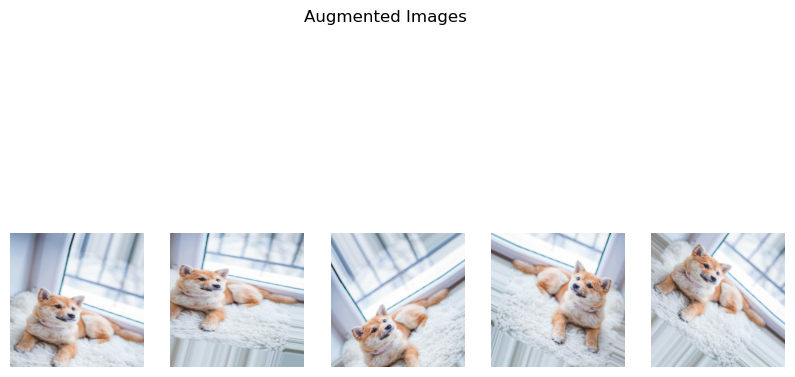

In [11]:
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator ,load_img,img_to_array
import numpy as np
image = load_img("C:\\Users\\punny\\Downloads\\pexels-valeriya-1805164.jpg",target_size=(224,224))
image = img_to_array(image)
image = np.expand_dims(image,axis=0) #Convert to batch format

datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

aug_iter = datagen.flow(image,batch_size=1)
plt.figure(figsize=(10,6))
for i in range(5):
    batch = next(aug_iter)
    img = batch[0].astype('uint8')
    plt.subplot(1,5,i+1)
    plt.imshow(img)
    plt.axis('off')
plt.suptitle('Augmented Images')
plt.show()
    

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step
Layer: input_layer_7 | Feature map shape: (1, 224, 224, 3)


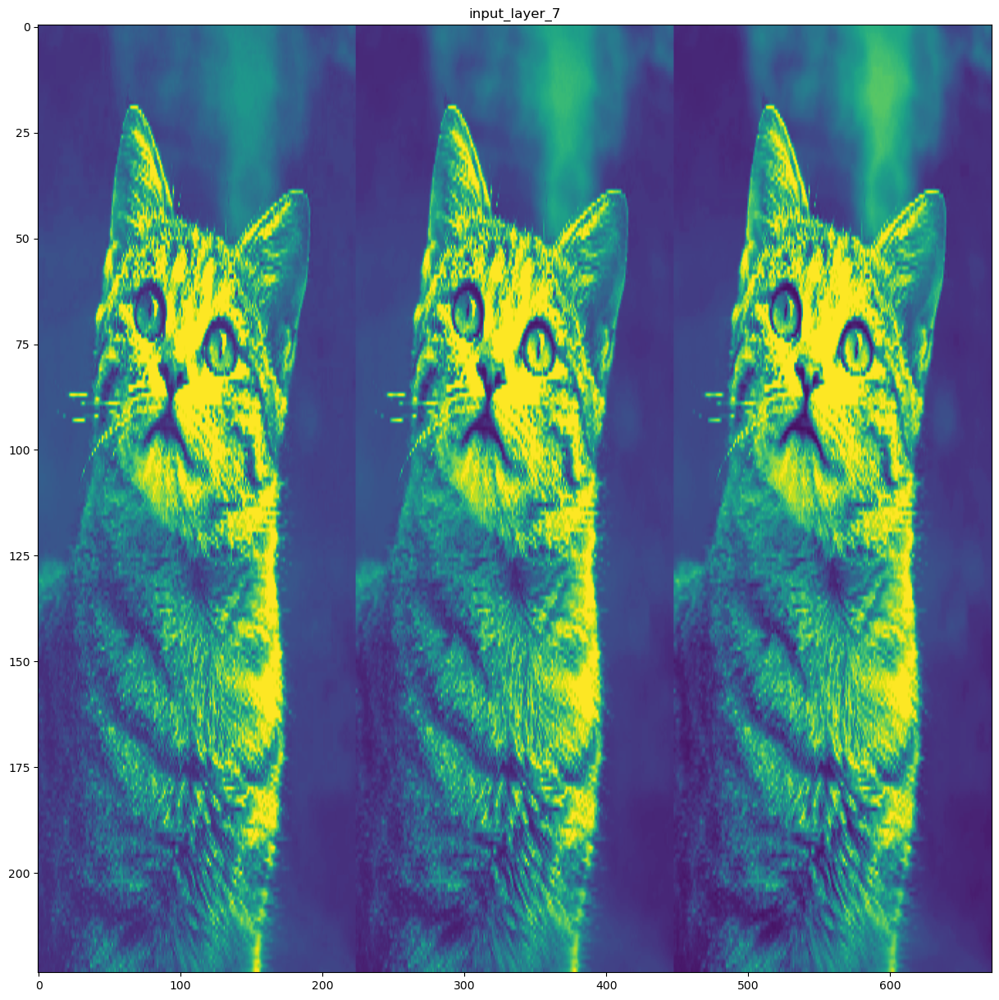

Layer: block1_conv1 | Feature map shape: (1, 224, 224, 64)


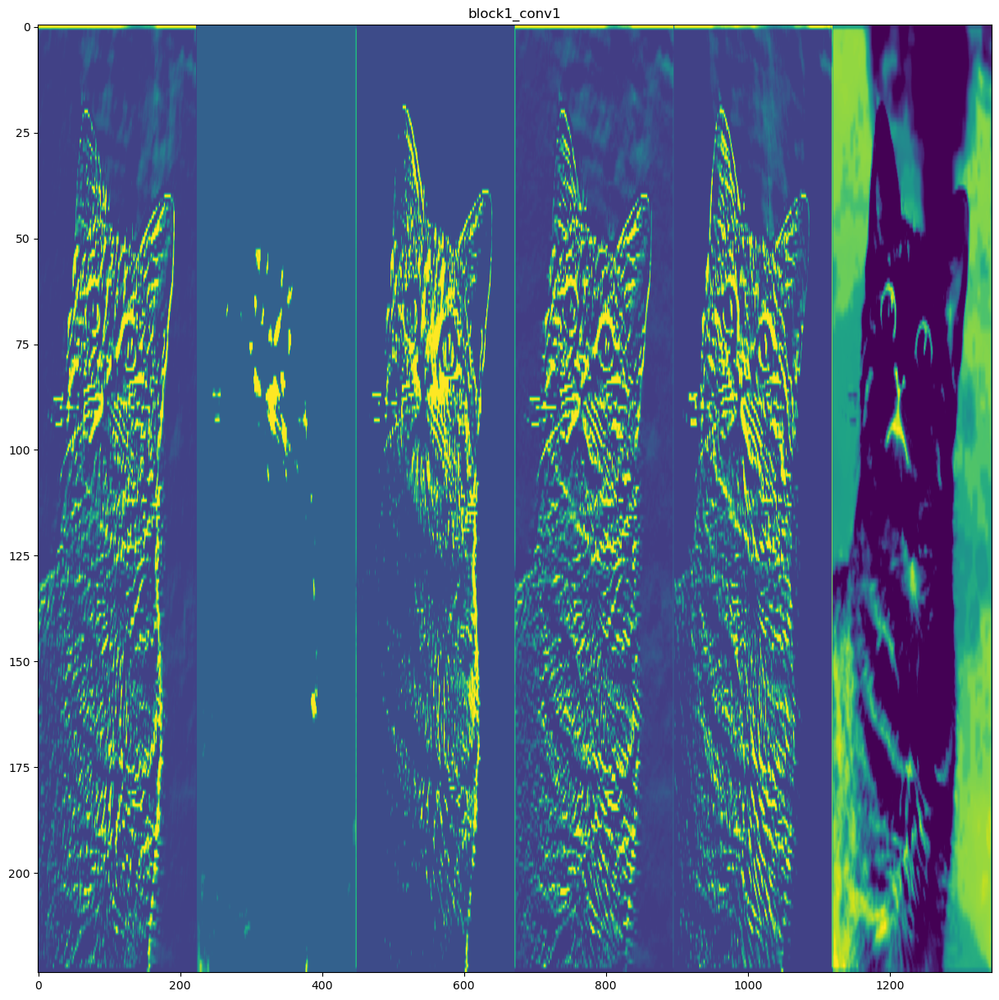

Layer: block1_conv2 | Feature map shape: (1, 224, 224, 64)


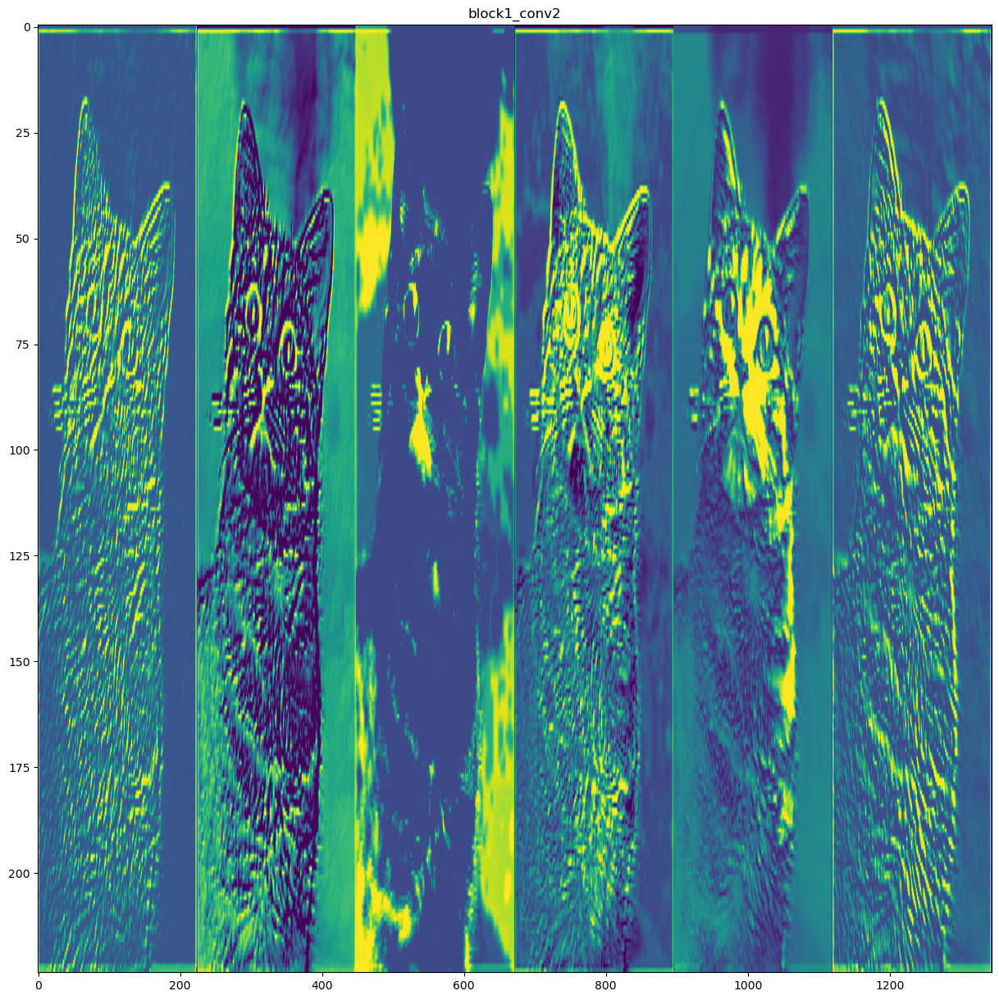

Layer: block1_pool | Feature map shape: (1, 112, 112, 64)


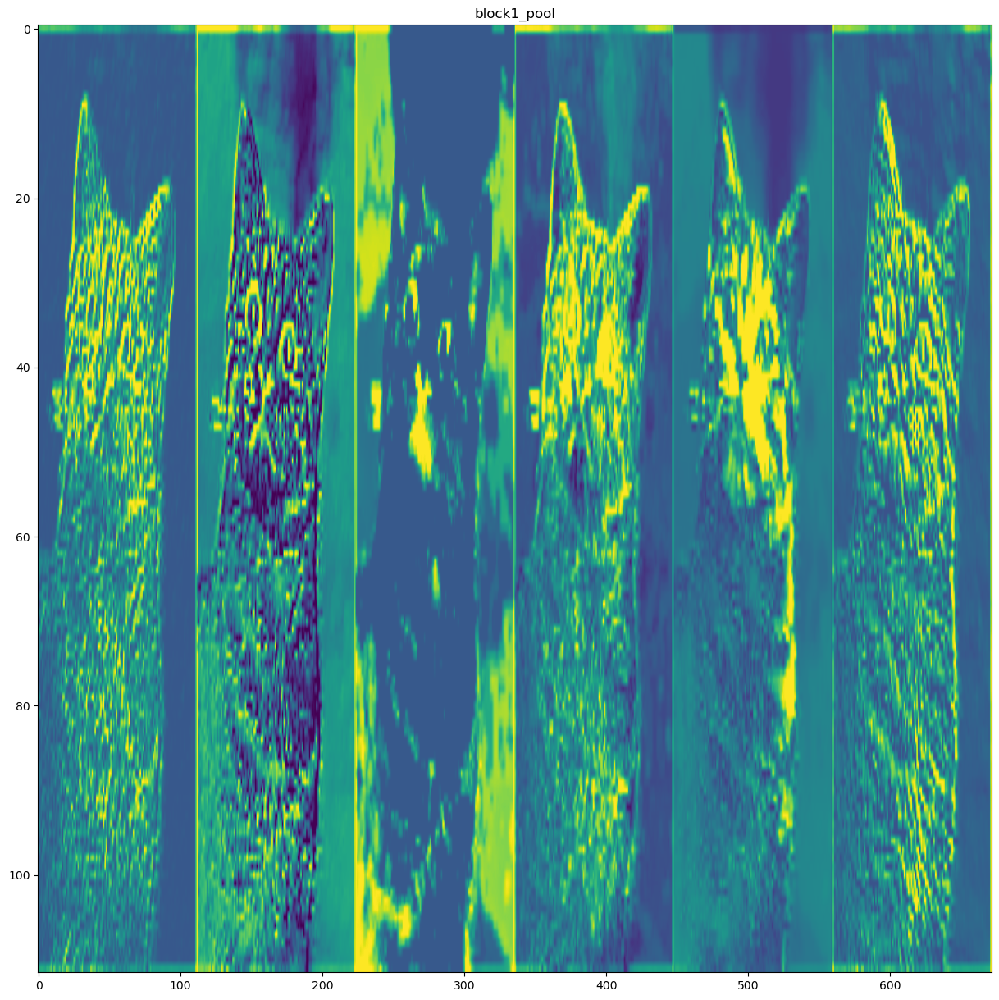

Layer: block2_conv1 | Feature map shape: (1, 112, 112, 128)


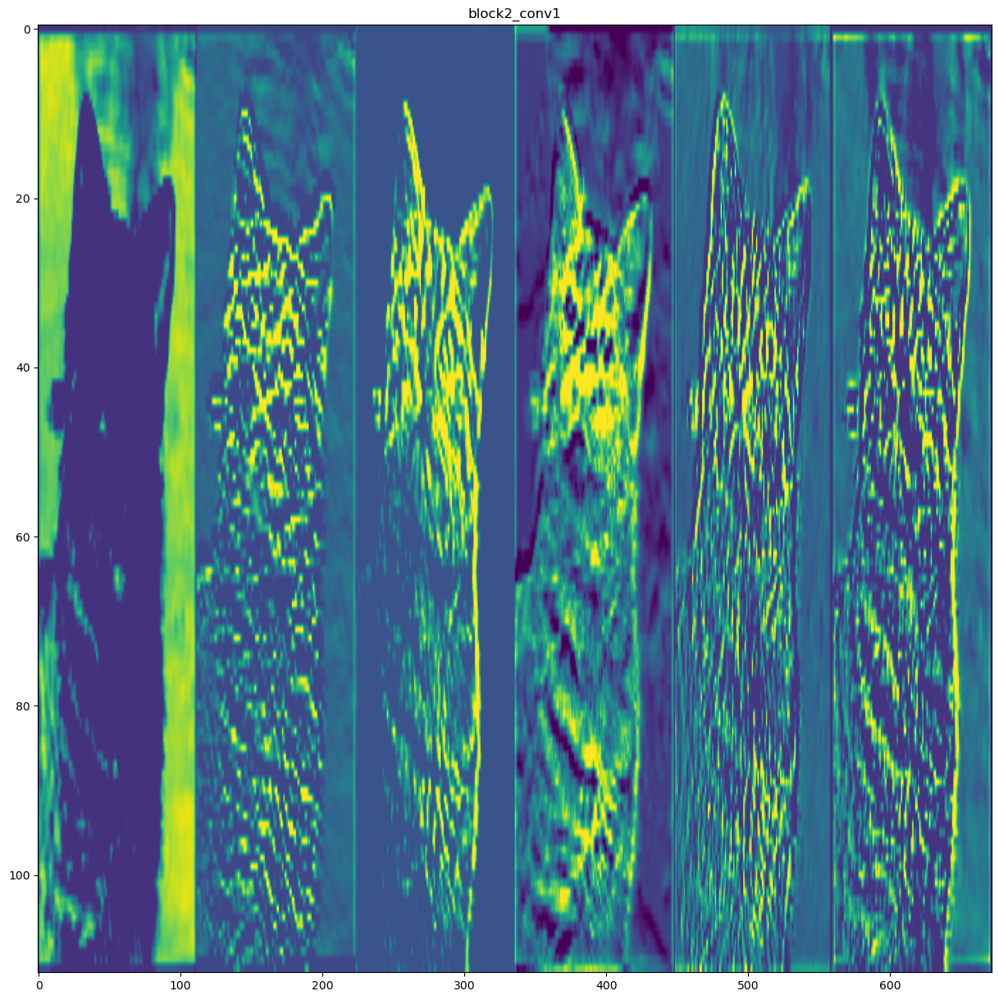

Layer: block2_conv2 | Feature map shape: (1, 112, 112, 128)


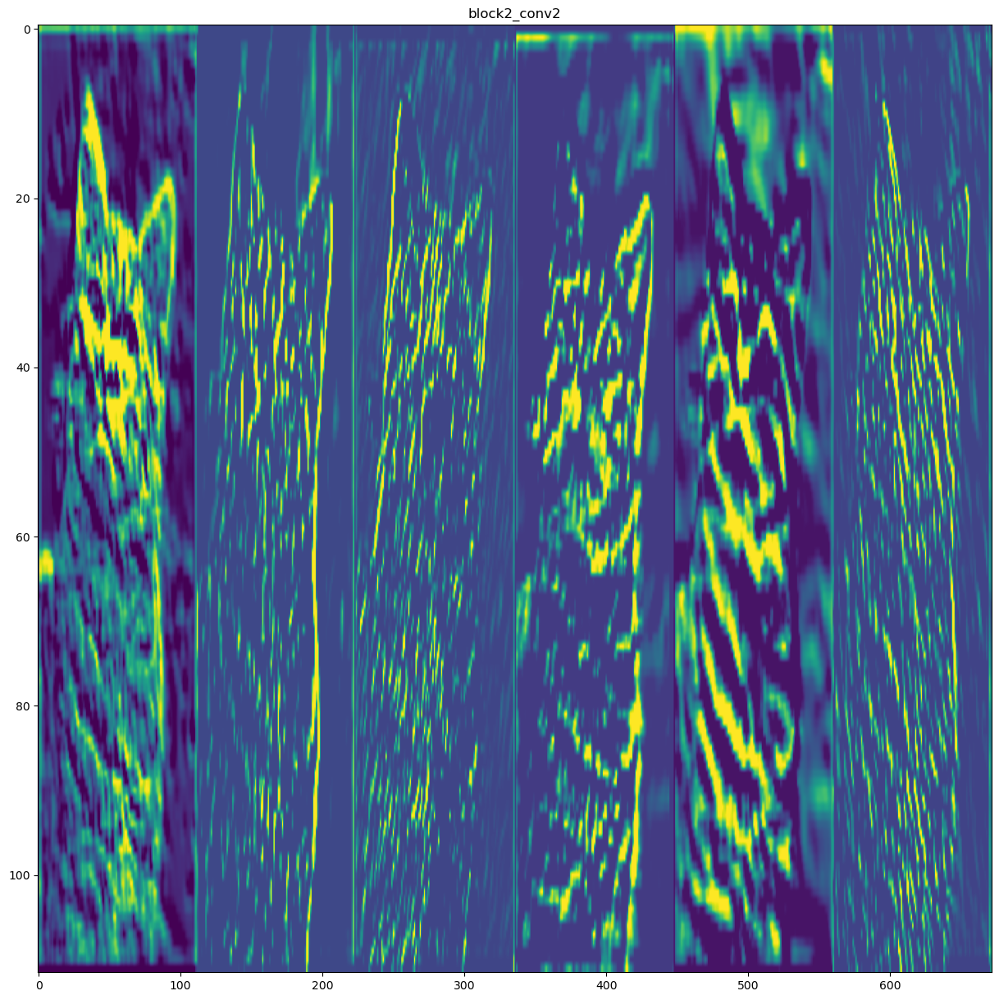

Layer: block2_pool | Feature map shape: (1, 56, 56, 128)


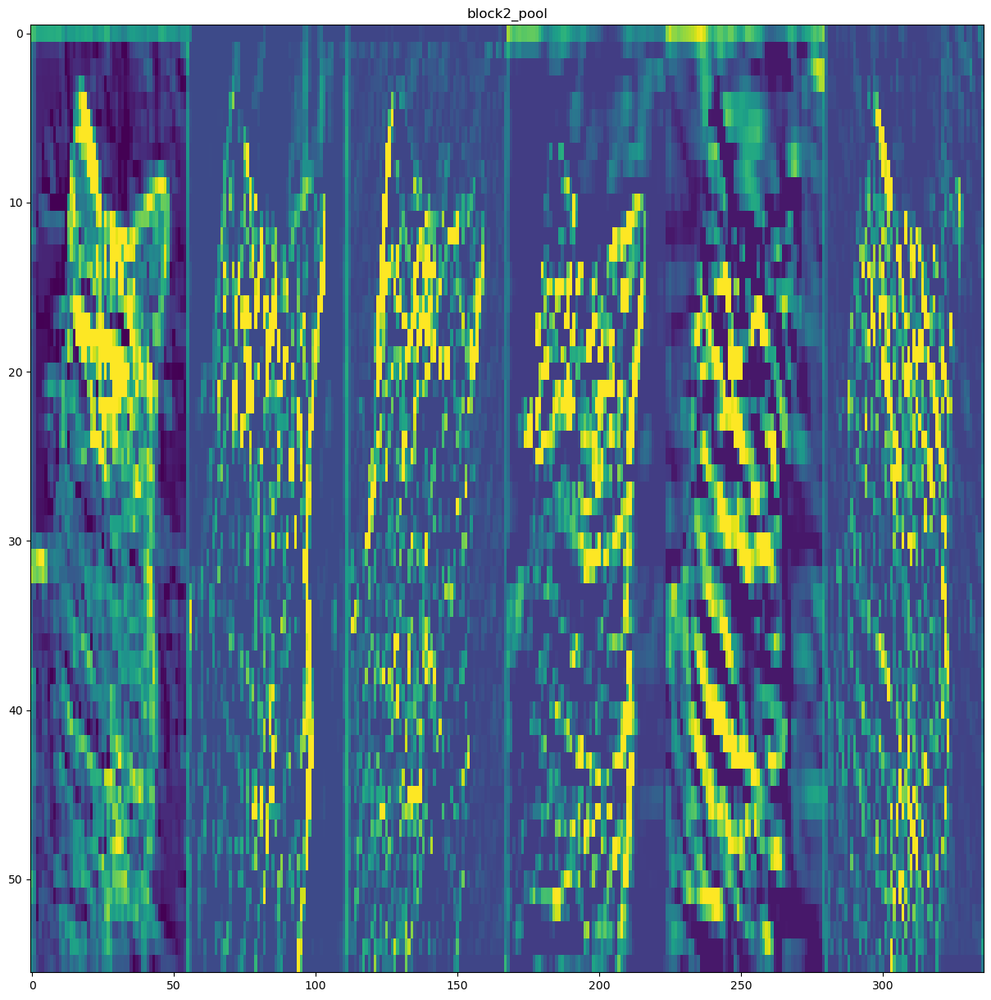

Layer: block3_conv1 | Feature map shape: (1, 56, 56, 256)


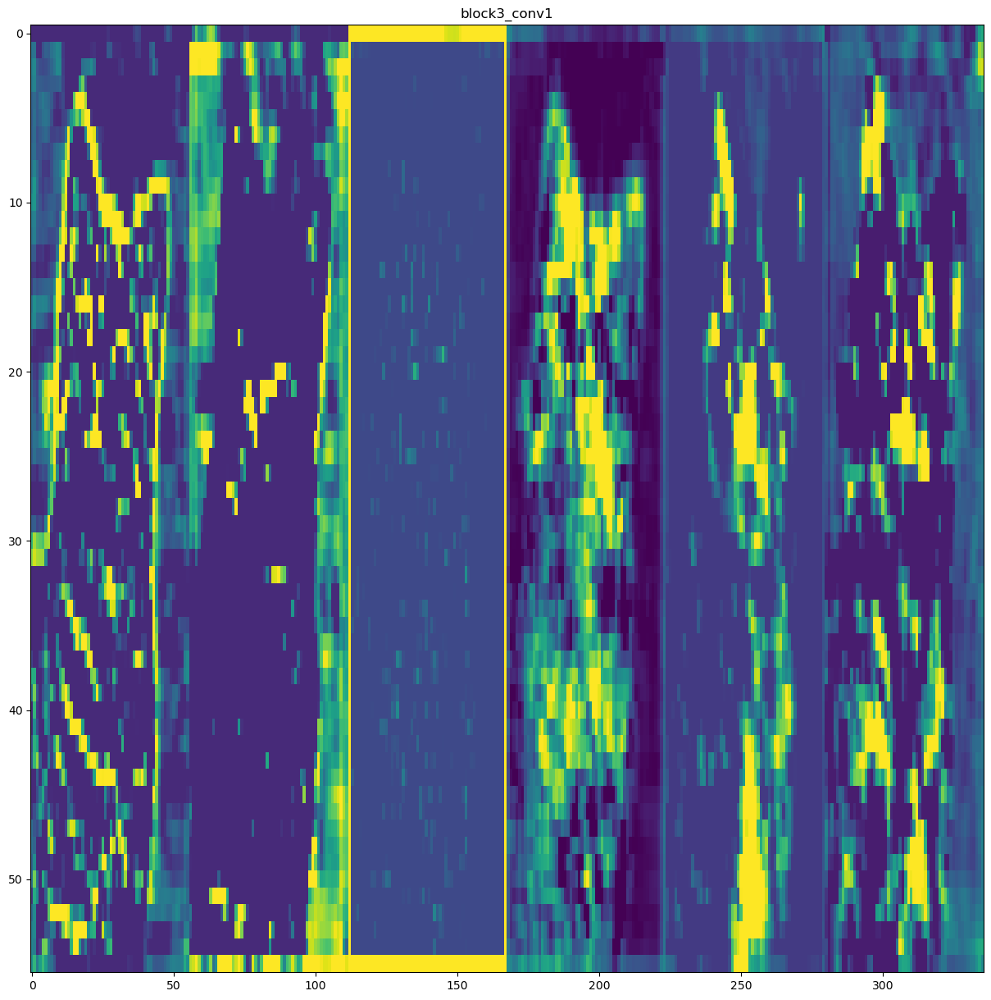

In [25]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input
import numpy as np
import matplotlib.pyplot as plt

#load the model
model = VGG16(weights='imagenet',include_top=False)

img_path = "C:/Users/punny/Pictures/Saved Pictures/cat.jpeg"
img = image.load_img(img_path,target_size=(224,224))
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array,axis=0)
img_array=preprocess_input(img_array)

layer_outputs = [layer.output for layer in model.layers[:8]]
activation_model = Model(inputs=model.input,outputs=layer_outputs)

feature_maps = activation_model.predict(img_array)

for layer_name, feature_map in zip([layer.name for layer in model.layers[:8]], feature_maps):
    print(f"Layer: {layer_name} | Feature map shape: {feature_map.shape}")
    n_features = feature_map.shape[-1]
    size = feature_map.shape[1]

    n_display = min(n_features, 6)  # Don't exceed actual number of channels
    display_grid = np.zeros((size, size * n_display))

    for i in range(n_display):
        x = feature_map[0, :, :, i]
        x -= x.mean()
        x /= (x.std() + 1e-6)
        x *= 64
        x += 128
        x = np.clip(x, 0, 255).astype('uint8')
        display_grid[:, i * size : (i + 1) * size] = x

    plt.figure(figsize=(15, 15))
    plt.title(f"{layer_name}")
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step
conv1 output shape: (1, 222, 222, 16)


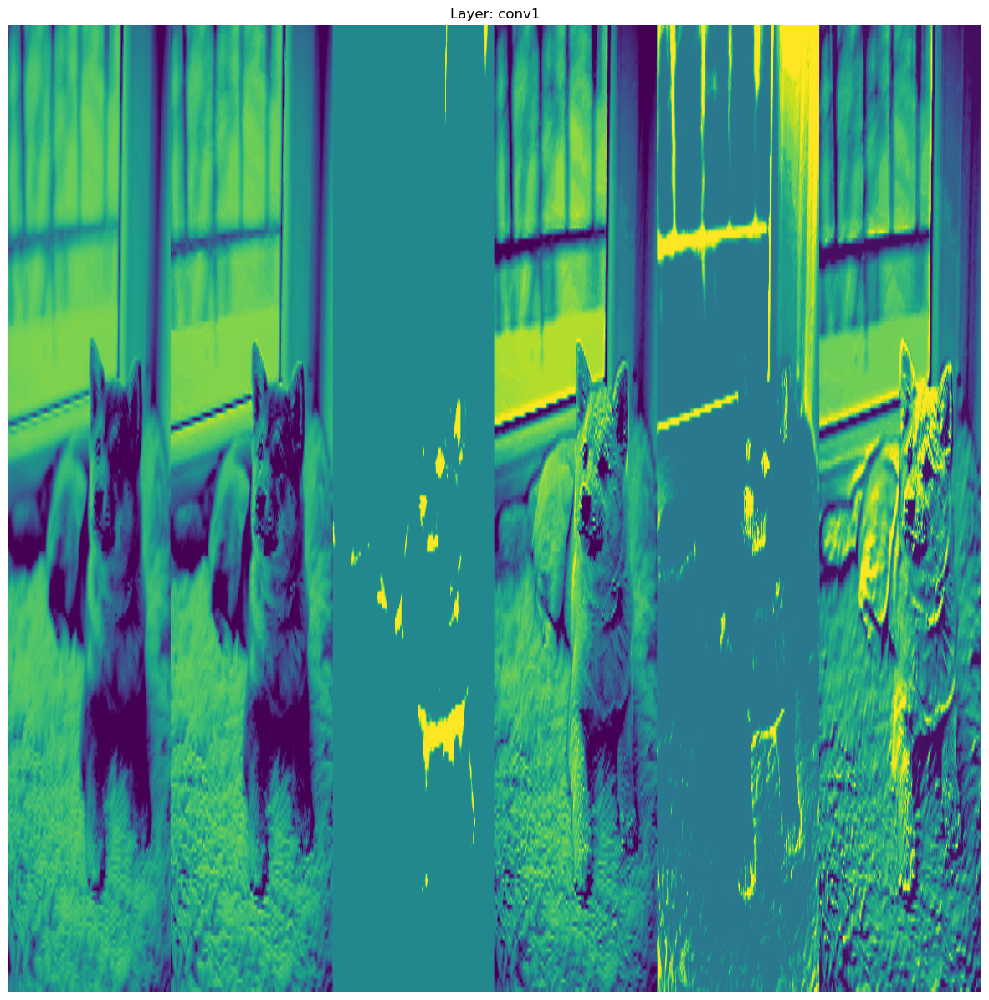

pool1 output shape: (1, 111, 111, 16)


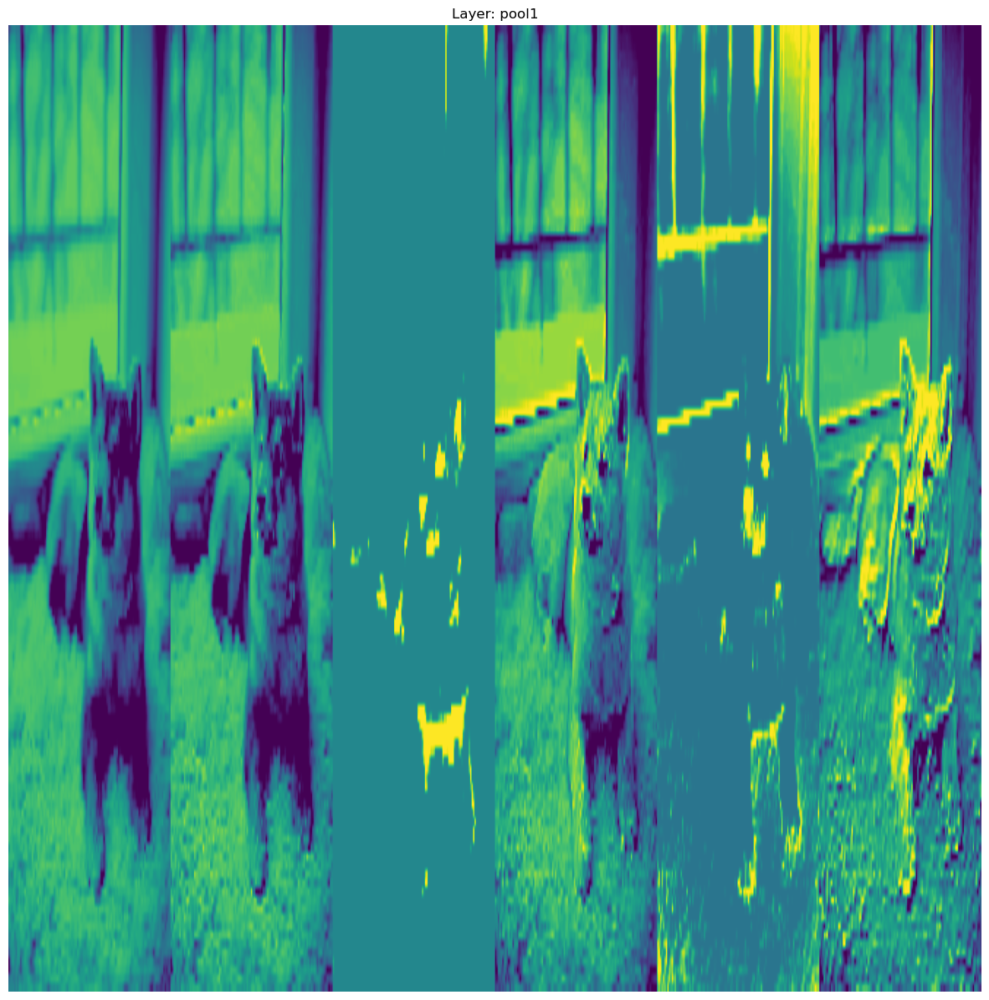

conv2 output shape: (1, 109, 109, 32)


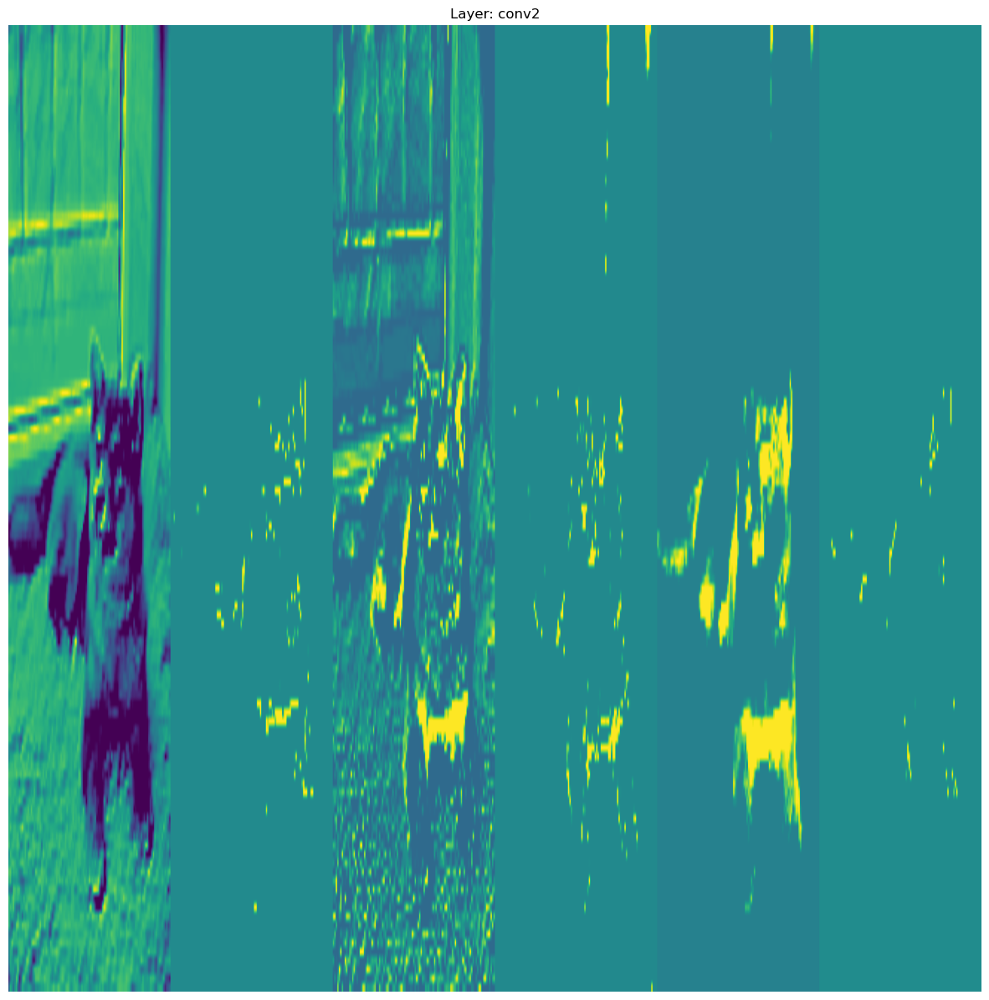

pool2 output shape: (1, 54, 54, 32)


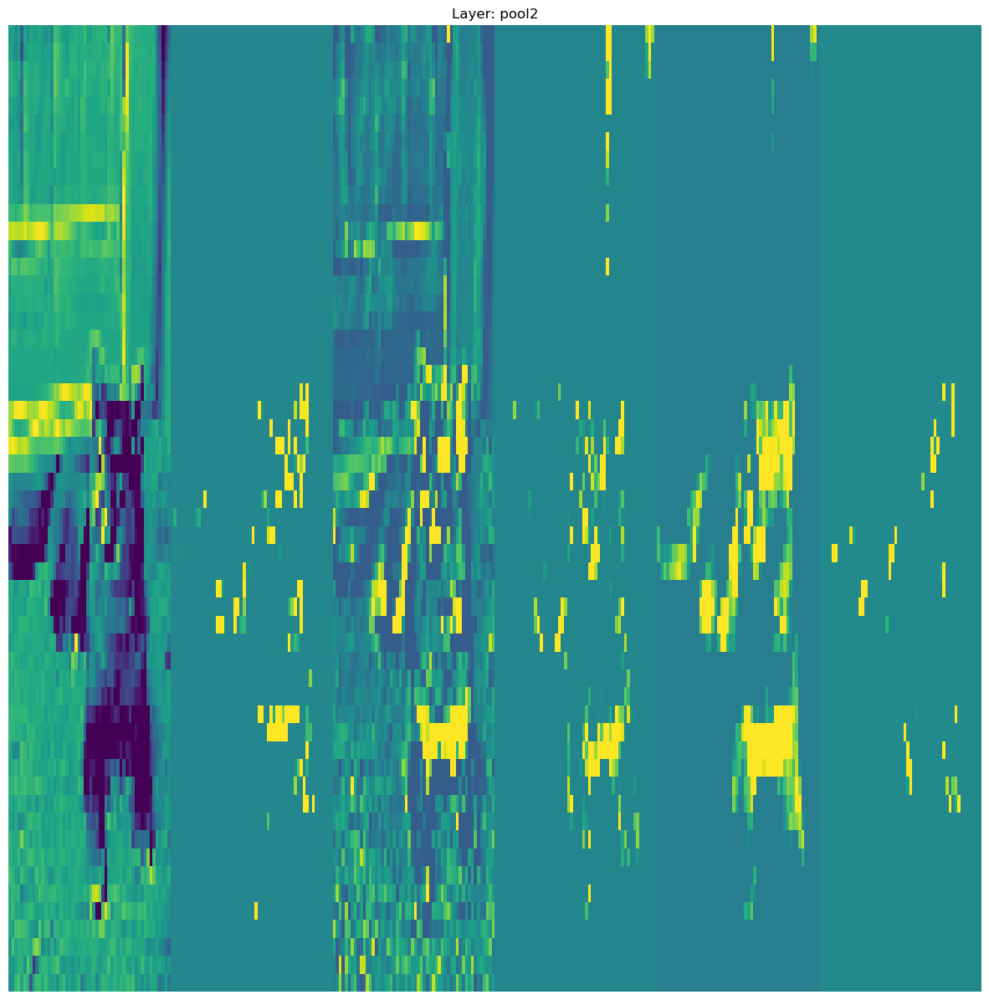

In [27]:
import numpy as np
import matplotlib.pyplot as plt

from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D,MaxPooling2D,Input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input

img_path ="C:/Users/punny/Downloads/pexels-valeriya-1805164.jpg"
img = image.load_img(img_path,target_size=(224,224))
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array,axis=0)
img_array = preprocess_input(img_array)

input_img = Input(shape=(224, 224, 3), name='input')
x = Conv2D(16, (3, 3), activation='relu', name='conv1')(input_img)
x = MaxPooling2D((2, 2), name='pool1')(x)
x = Conv2D(32, (3, 3), activation='relu', name='conv2')(x)
x = MaxPooling2D((2, 2), name='pool2')(x)

# Define base model
model = Model(inputs=input_img, outputs=x)
layer_names=['conv1','pool1','conv2','pool2']
outputs = [model.get_layer(name).output for name in layer_names]
activation_model = Model(inputs=model.input,outputs=outputs)

feature_maps = activation_model.predict(img_array)

for layer_name, fmap in zip(layer_names, feature_maps):
    print(f"{layer_name} output shape: {fmap.shape}")
    n_features = fmap.shape[-1]
    n_display = min(n_features, 6)  # Display up to 6 filters
    size = fmap.shape[1]
    
    display_grid = np.zeros((size, size * n_display))
    for i in range(n_display):
        x = fmap[0, :, :, i]
        x -= x.mean()
        x /= (x.std() + 1e-6)
        x *= 64
        x += 128
        x = np.clip(x, 0, 255).astype('uint8')
        display_grid[:, i * size:(i + 1) * size] = x

    plt.figure(figsize=(15, 15))
    plt.title(f"Layer: {layer_name}")
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    plt.axis('off')
    plt.show()
